# Plant UML

@startuml
skinparam titleFontSize 20
skinparam sequence {
  BackgroundColor #F9F9F9
  BorderColor #A9A9A9
  FontSize 14
  ArrowColor #000000
  ActorBorderColor black
  LifeLineBorderColor black
  LifeLineBackgroundColor #DDDDDD
  ParticipantBackgroundColor #FFFFFF
  ParticipantBorderColor black
}

title How Generative Adversarial Networks (GANs) Work

actor User

participant "Training Data" as TD
participant "Generator" as G
participant "Discriminator" as D
participant "Loss Function" as LF

User -> TD : Provides real data
TD -> D : Supplies real data

User -> G : Starts generation process
G -> D : Sends fake data
D -> LF : Evaluates real and fake data
LF -> D : Sends evaluation feedback
D -> G : Provides feedback (real/fake)
LF -> G : Adjusts parameters

note over G
  Generator:
  - Generates data samples
  - Example outputs: simple shapes, detailed human faces
end note

note over D
  Discriminator:
  - Evaluates data samples
  - Identifies fake data from real samples
  - Competes with the Generator
end note

note over LF
  Loss Function:
  - Measures difference between real and fake data
  - Adjusts Generator to improve fake data quality
end note

@enduml


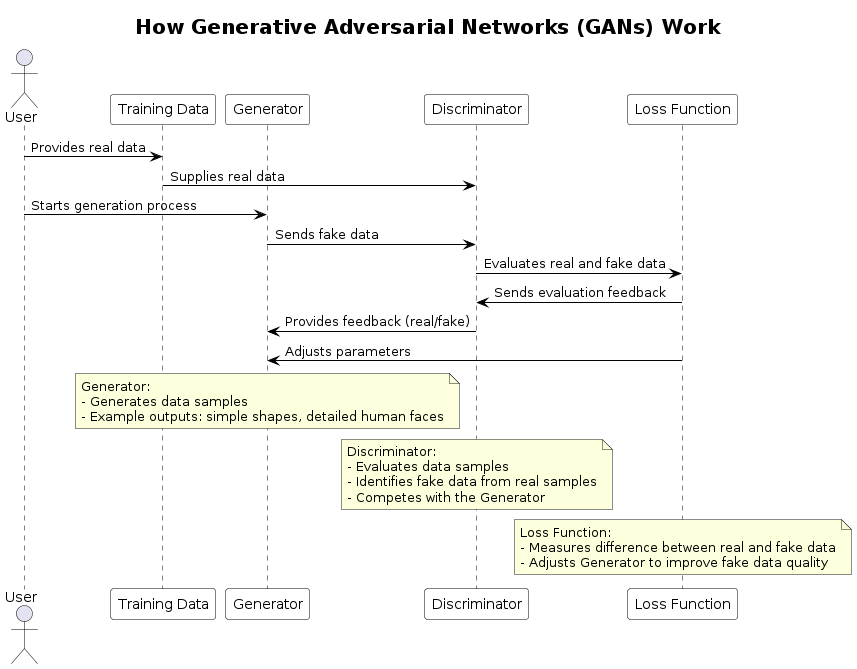

#Plant UML How Transformers Generate Data



@startuml
skinparam titleFontSize 20
skinparam component {
  BackgroundColor #F9F9F9
  BorderColor #A9A9A9
  FontSize 14
}

title How Transformers Generate Data

package "Transformer Model" {
    component [Input Sequence] as Input
    component [Encoder] as Encoder
    component [Decoder] as Decoder
    component [Attention Mechanism] as Attention
    component [Output Sequence] as Output
    
    Input --> Encoder : Encodes input
    Encoder --> Attention : Provides encoded input
    Attention --> Decoder : Enhances decoding with dependencies
    Encoder --> Decoder : Provides encoded input (optional path)
    Decoder --> Output : Generates output sequence
    
    note right of Encoder
        - Processes input sequence
        - Generates encoded representations
    end note

    note right of Attention
        - Captures long-range dependencies
        - Enhances decoder with context
    end note

    note right of Decoder
        - Decodes the encoded sequence
        - Generates the final output
    end note
}

@enduml


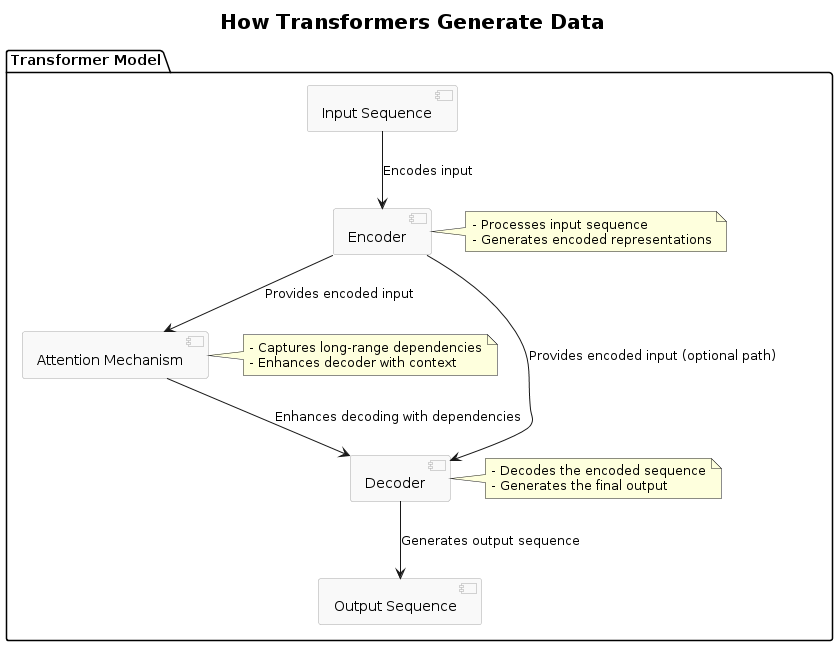

##GANs Example

Files already downloaded and verified


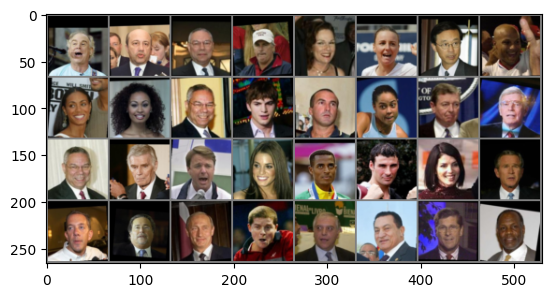

In [ ]:
import torch
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
import torchvision.utils as vutils

# Define transformations for the dataset
transform = transforms.Compose([
    transforms.Resize(64),  # Resize images to 64x64
    transforms.CenterCrop(64),  # Crop the central part of the image
    transforms.ToTensor(),  # Convert images to tensors
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalize the images
])

# Load the LFW dataset
dataset = datasets.LFWPeople(root='./data', split='train', download=True, transform=transform)
dataloader = DataLoader(dataset, batch_size=32, shuffle=True)

# Function to unnormalize and display images
def imshow(img):
    img = img / 2 + 0.5  # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

# Get a batch of images
dataiter = iter(dataloader)
images, _ = next(dataiter)

# Show images
imshow(vutils.make_grid(images))




In [ ]:
import torch
import torchvision.utils as vutils

# Path to the pretrained model file
pretrained_model_path = './pretrained_dcgan.pth'

# Check if the pretrained model file exists
import os
if not os.path.exists(pretrained_model_path):
    print(f"Error: Pretrained model file not found at {pretrained_model_path}")
else:
    # Load the pretrained model
    netG = torch.load(pretrained_model_path)

    # Generate new faces
    noise = torch.randn(64, 100, 1, 1)  # Generate random noise
    with torch.no_grad():
        fake_images = netG(noise).detach().cpu()

    # Display generated images
    import matplotlib.pyplot as plt
    import numpy as np

    # Function to unnormalize and display images
    def imshow(img):
        img = img / 2 + 0.5  # unnormalize
        npimg = img.numpy()
        plt.imshow(np.transpose(npimg, (1, 2, 0)))
        plt.show()

    imshow(vutils.make_grid(fake_images, padding=2, normalize=True))


Error: Pretrained model file not found at ./pretrained_dcgan.pth


In [ ]:
!pip install pytorch-pretrained-biggan


In [ ]:
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [ ]:
!pip install torchvision

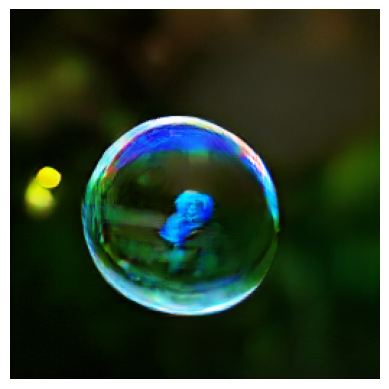

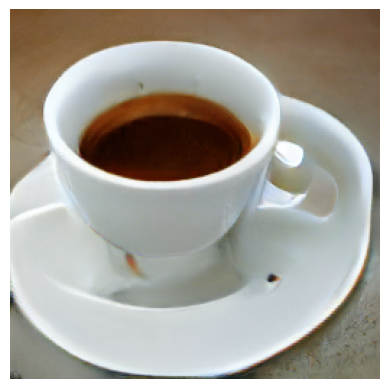

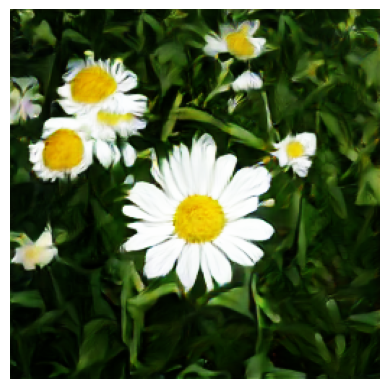

In [ ]:
import torch
from pytorch_pretrained_biggan import BigGAN, truncated_noise_sample, one_hot_from_names
import matplotlib.pyplot as plt
import numpy as np

# Load pre-trained BigGAN model
model = BigGAN.from_pretrained('biggan-deep-256')

# Prepare input
truncation = 0.4
class_vector = one_hot_from_names(['soap bubble', 'coffee', 'flowers'], batch_size=3)
noise_vector = truncated_noise_sample(truncation=truncation, batch_size=3)

# Convert to PyTorch tensors
noise_vector = torch.from_numpy(noise_vector)
class_vector = torch.from_numpy(class_vector)

# If you have a GPU, move everything to CUDA
if torch.cuda.is_available():
    noise_vector = noise_vector.to('cuda')
    class_vector = class_vector.to('cuda')
    model.to('cuda')

# Generate images
with torch.no_grad():
    output = model(noise_vector, class_vector, truncation)

# Move output back to CPU
output = output.to('cpu')

# Function to display images
def imshow(img):
    img = (img + 1) / 2  # Rescale the images from [-1, 1] to [0, 1]
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.axis('off')
    plt.show()

# Display generated images
for i in range(output.size(0)):
    imshow(output[i])

# Save results as PNG images
for i in range(output.size(0)):
    vutils.save_image(output[i], f'generated_image_{i}.png')


Generation Example -Model Building

In [ ]:
!pip install kaggle


In [ ]:
import os
import zipfile

# Make a directory for the Kaggle API key
!mkdir -p ~/.kaggle

# Move the kaggle.json file to the ~/.kaggle directory
!mv kaggle.json ~/.kaggle/

# Set the permissions of the kaggle.json file
!chmod 600 ~/.kaggle/kaggle.json


In [ ]:
# Download the dataset
!kaggle datasets download -d splcher/animefacedataset

# Unzip the downloaded file
with zipfile.ZipFile('animefacedataset.zip', 'r') as zip_ref:
    zip_ref.extractall('animefaces')

print("Dataset downloaded and extracted")


Dataset URL: https://www.kaggle.com/datasets/splcher/animefacedataset
License(s): DbCL-1.0
100% 395M/395M [00:02<00:00, 226MB/s]
100% 395M/395M [00:02<00:00, 206MB/s]
Dataset downloaded and extracted


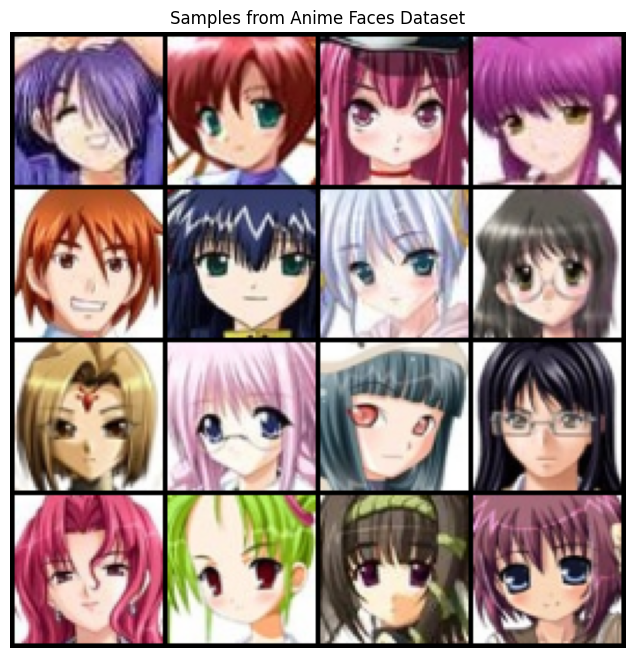

In [ ]:
import torch
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from torchvision.utils import make_grid
import torchvision.datasets as dsets

class AnimeFacesDataset:
    def __init__(self, root_dir, transform=None):
        self.dataset = dsets.ImageFolder(root=root_dir, transform=transform)

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        return self.dataset[idx]

# Define image transformations
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

# Load the dataset
root_dir = 'animefaces'  # Adjust this path if necessary
dataset = AnimeFacesDataset(root_dir=root_dir, transform=transform)
dataloader = DataLoader(dataset, batch_size=128, shuffle=True)

# Visualize some samples from the dataset
def show_samples(dataset, num_samples=16):
    samples = [dataset[i][0] for i in range(num_samples)]
    grid = make_grid(samples, nrow=4, normalize=True)
    plt.figure(figsize=(8, 8))
    plt.axis("off")
    plt.title("Samples from Anime Faces Dataset")
    plt.imshow(np.transpose(grid.numpy(), (1, 2, 0)))
    plt.show()

# Show samples from the dataset
show_samples(dataset)


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as transforms
import torchvision.datasets as dsets
import matplotlib.pyplot as plt
import numpy as np
from torchvision.utils import make_grid

# Check for GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')



In [ ]:
class AnimeFacesDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.dataset = dsets.ImageFolder(root=root_dir, transform=transform)

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        return self.dataset[idx]

# Define image transformations
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

# Load the dataset
root_dir = '/content/animefaces'
dataset = AnimeFacesDataset(root_dir=root_dir, transform=transform)
dataloader = DataLoader(dataset, batch_size=128, shuffle=True)




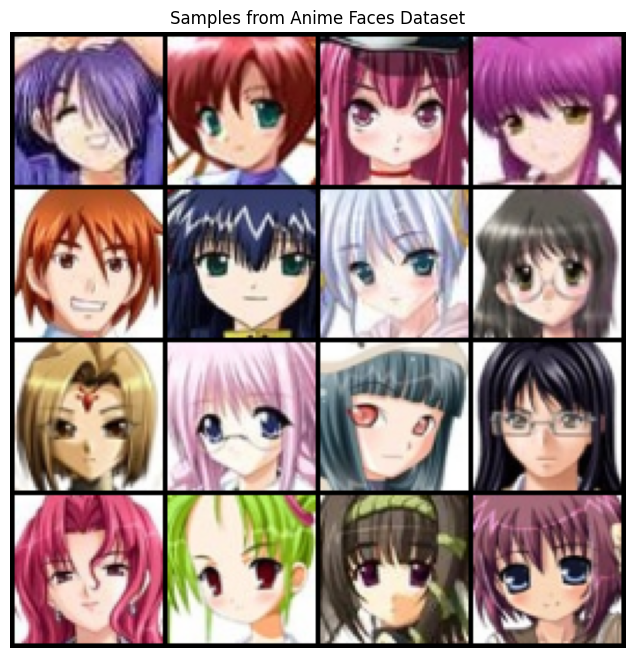

In [ ]:
# Visualize some samples from the dataset
def show_samples(dataset, num_samples=16):
    samples = [dataset[i][0] for i in range(num_samples)]
    grid = make_grid(samples, nrow=4, normalize=True)
    plt.figure(figsize=(8, 8))
    plt.axis("off")
    plt.title("Samples from Anime Faces Dataset")
    plt.imshow(np.transpose(grid.numpy(), (1, 2, 0)))
    plt.show()

# Show samples from the dataset
show_samples(dataset)


##Training Model

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
import torchvision.datasets as dsets
import matplotlib.pyplot as plt
import numpy as np
from torchvision.utils import make_grid
import zipfile
from google.colab import files

# Check for GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


In [ ]:
device

device(type='cuda')

In [ ]:
import os
import zipfile

# Make a directory for the Kaggle API key
!mkdir -p ~/.kaggle

# Move the kaggle.json file to the ~/.kaggle directory
!mv kaggle.json ~/.kaggle/

# Set the permissions of the kaggle.json file
!chmod 600 ~/.kaggle/kaggle.json


In [ ]:
"""
# Step 1: Install Kaggle API
!pip install kaggle

# Step 2: Upload kaggle.json
from google.colab import files
files.upload()

# Step 3: Configure Kaggle API
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
"""
# Step 4: Download and extract the dataset
!kaggle datasets download -d splcher/animefacedataset

with zipfile.ZipFile('animefacedataset.zip', 'r') as zip_ref:
    zip_ref.extractall('animefaces')

print("Dataset downloaded and extracted")


Dataset URL: https://www.kaggle.com/datasets/splcher/animefacedataset
License(s): DbCL-1.0
 97% 384M/395M [00:02<00:00, 157MB/s]
100% 395M/395M [00:02<00:00, 179MB/s]
Dataset downloaded and extracted


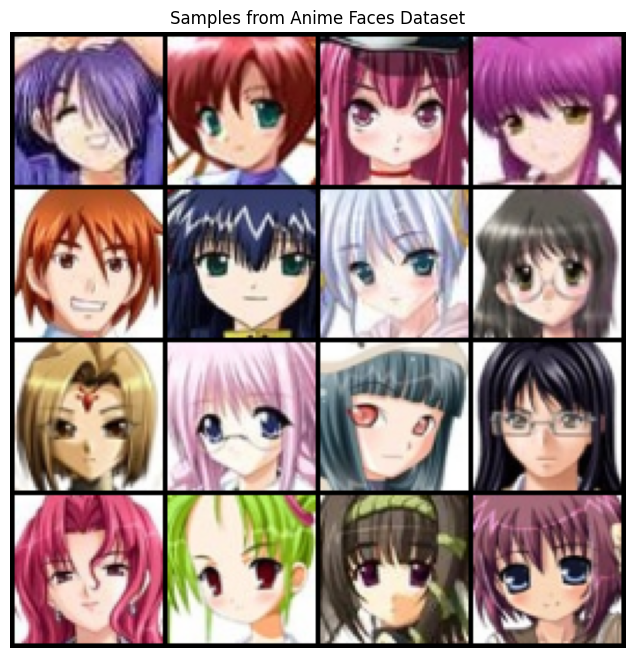

In [ ]:
class AnimeFacesDataset:
    def __init__(self, root_dir, transform=None):
        self.dataset = dsets.ImageFolder(root=root_dir, transform=transform)

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        return self.dataset[idx]

# Define image transformations
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

# Load the dataset
root_dir = 'animefaces'
dataset = AnimeFacesDataset(root_dir=root_dir, transform=transform)
dataloader = DataLoader(dataset, batch_size=128, shuffle=True)

# Visualize some samples from the dataset
def show_samples(dataset, num_samples=16):
    samples = [dataset[i][0] for i in range(num_samples)]
    grid = make_grid(samples, nrow=4, normalize=True)
    plt.figure(figsize=(8, 8))
    plt.axis("off")
    plt.title("Samples from Anime Faces Dataset")
    plt.imshow(np.transpose(grid.numpy(), (1, 2, 0)))
    plt.show()

# Show samples from the dataset
show_samples(dataset)


In [ ]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            nn.Linear(100, 256),
            nn.ReLU(True),
            nn.Linear(256, 512),
            nn.ReLU(True),
            nn.Linear(512, 1024),
            nn.ReLU(True),
            nn.Linear(1024, 64 * 64 * 3),
            nn.Tanh()
        )

    def forward(self, x):
        return self.main(x).view(-1, 3, 64, 64)

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Linear(64 * 64 * 3, 1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x.view(-1, 64 * 64 * 3))

# Create instances of the networks
netG = Generator().to(device)
netD = Discriminator().to(device)


In [ ]:
criterion = nn.BCELoss()
optimizerD = optim.Adam(netD.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=0.0002, betas=(0.5, 0.999))


Epoch [0/50] Loss D: 0.6789870262145996, Loss G: 1.4783650636672974


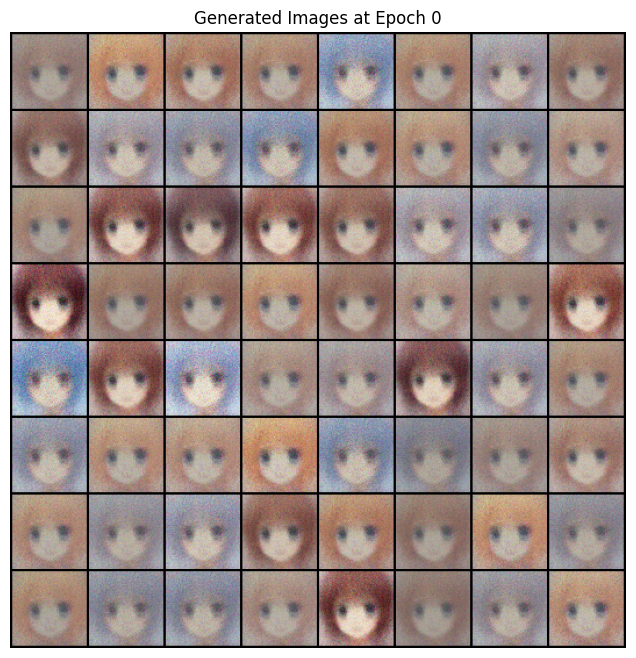

Epoch [10/50] Loss D: 1.107199788093567, Loss G: 1.9700392484664917


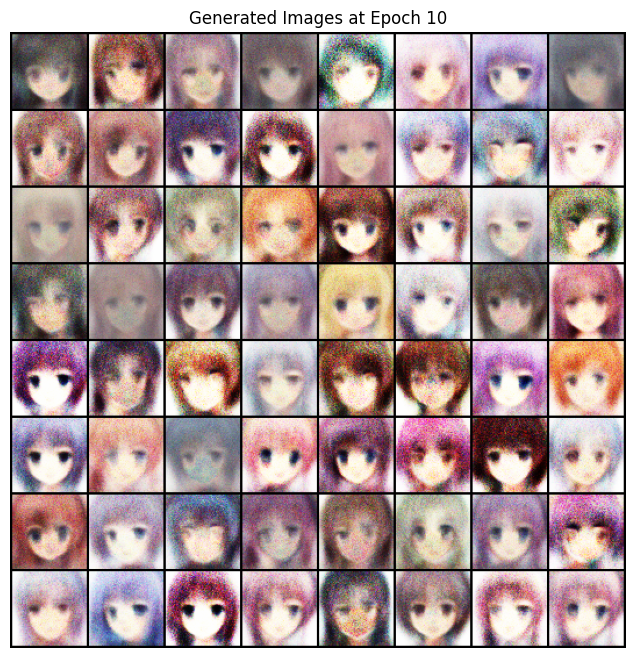

Epoch [20/50] Loss D: 1.0113476514816284, Loss G: 2.2287700176239014


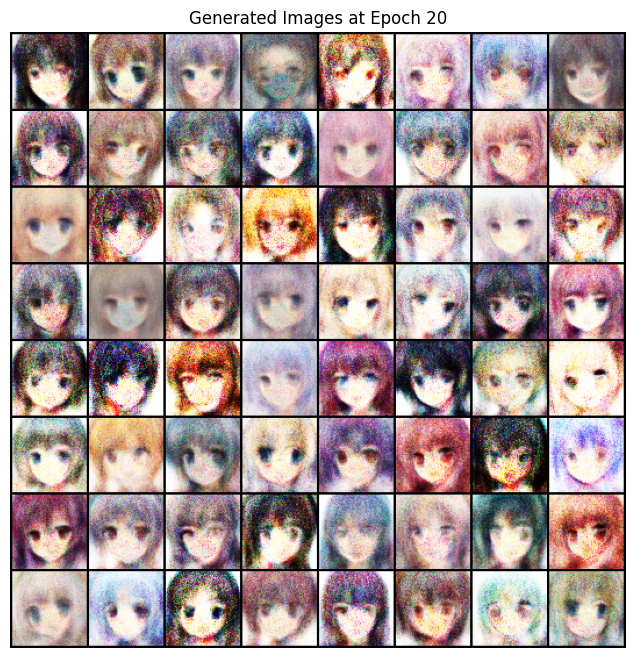

Epoch [30/50] Loss D: 0.8684166669845581, Loss G: 2.1686341762542725


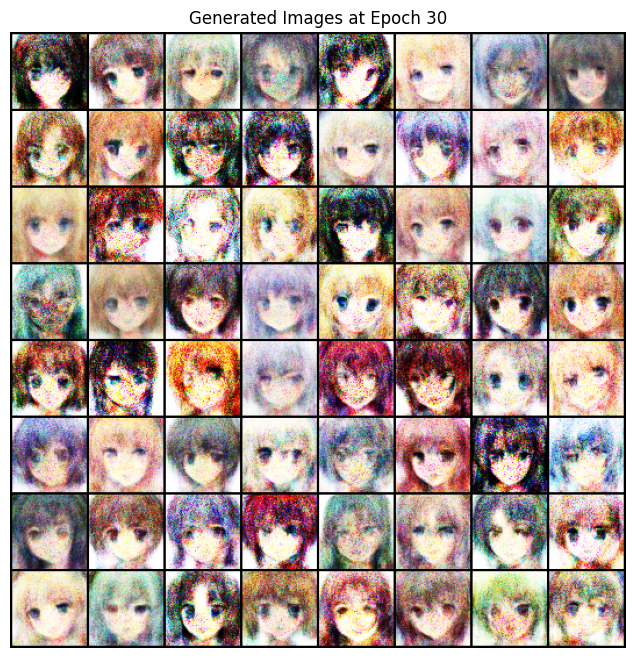

Epoch [40/50] Loss D: 0.906580924987793, Loss G: 2.8312137126922607


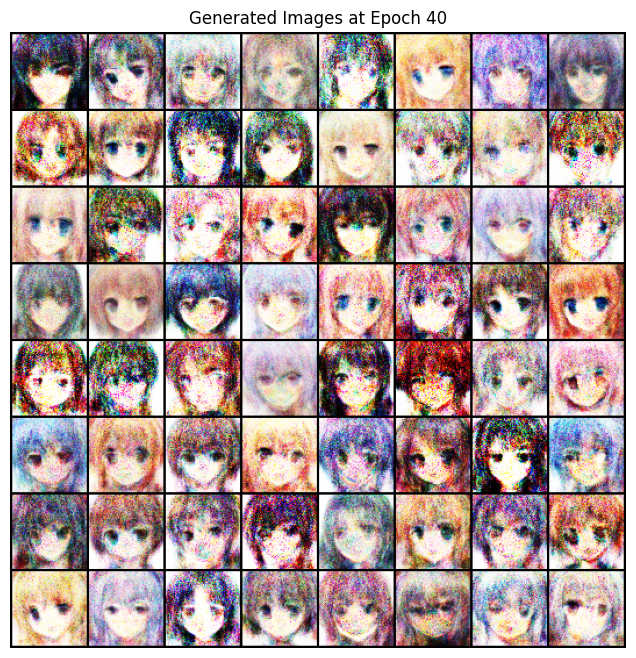

In [ ]:
num_epochs = 50
fixed_noise = torch.randn(64, 100, device=device)

for epoch in range(num_epochs):
    for i, data in enumerate(dataloader, 0):
        # Train Discriminator
        netD.zero_grad()
        real_data = data[0].to(device)
        batch_size = real_data.size(0)
        labels = torch.full((batch_size,), 1, device=device, dtype=torch.float)

        output = netD(real_data).view(-1)
        lossD_real = criterion(output, labels)
        lossD_real.backward()

        noise = torch.randn(batch_size, 100, device=device)
        fake_data = netG(noise)
        labels.fill_(0)

        output = netD(fake_data.detach()).view(-1)
        lossD_fake = criterion(output, labels)
        lossD_fake.backward()

        optimizerD.step()

        # Train Generator
        netG.zero_grad()
        labels.fill_(1)
        output = netD(fake_data).view(-1)
        lossG = criterion(output, labels)
        lossG.backward()
        optimizerG.step()

    # Print losses and save generated images every few epochs
    if epoch % 10 == 0:
        print(f'Epoch [{epoch}/{num_epochs}] Loss D: {lossD_real + lossD_fake}, Loss G: {lossG}')
        with torch.no_grad():
            fake = netG(fixed_noise).detach().cpu()
        plt.figure(figsize=(8, 8))
        plt.axis("off")
        plt.title(f"Generated Images at Epoch {epoch}")
        plt.imshow(np.transpose(make_grid(fake, padding=2, normalize=True), (1, 2, 0)))
        plt.show()


Models saved.
Models loaded.


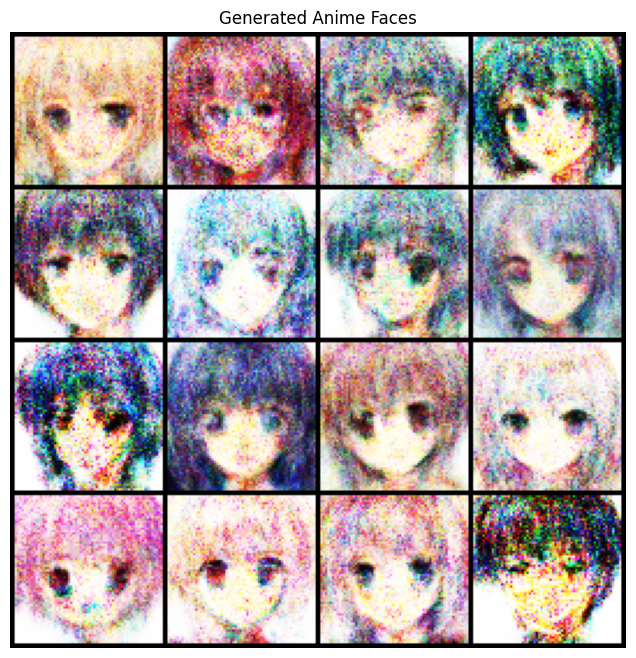

In [ ]:
# Save the trained models
torch.save(netG.state_dict(), 'generator.pth')
torch.save(netD.state_dict(), 'discriminator.pth')
print("Models saved.")

# Load the trained models
netG = Generator().to(device)
netD = Discriminator().to(device)

netG.load_state_dict(torch.load('generator.pth'))
netD.load_state_dict(torch.load('discriminator.pth'))

print("Models loaded.")

# Function to generate and visualize new faces
def generate_faces(generator, num_images=16):
    generator.eval()  # Set the generator to evaluation mode
    noise = torch.randn(num_images, 100, device=device)
    with torch.no_grad():
        fake_images = generator(noise).detach().cpu()
    grid = make_grid(fake_images, nrow=4, normalize=True)
    plt.figure(figsize=(8, 8))
    plt.axis("off")
    plt.title("Generated Anime Faces")
    plt.imshow(np.transpose(grid.numpy(), (1, 2, 0)))
    plt.show()

# Generate new faces
generate_faces(netG)

DCGAN with Celebs Dataset

In [ ]:
# Install Kaggle API if not already installed
#!pip install kaggle



# Download the CelebA dataset
!kaggle datasets download -d jessicali9530/celeba-dataset -p ./data --unzip


Dataset URL: https://www.kaggle.com/datasets/jessicali9530/celeba-dataset
License(s): other
 99% 1.31G/1.33G [00:12<00:00, 208MB/s]
100% 1.33G/1.33G [00:12<00:00, 110MB/s]


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
import numpy as np


In [ ]:
class Generator(nn.Module):
    def __init__(self, nz):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            nn.ConvTranspose2d(nz, 512, 4, 1, 0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            nn.ConvTranspose2d(512, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 3, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, input):
        return self.main(input)


In [ ]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(3, 64, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 512, 4, 2, 1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(512, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input).view(-1)


In [ ]:
nz = 100  # Size of the latent vector
ngf = 64  # Size of feature maps in generator
ndf = 64  # Size of feature maps in discriminator
nc = 3    # Number of channels in the training images. For color images this is 3

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

netG = Generator(nz).to(device)
netD = Discriminator().to(device)

criterion = nn.BCELoss()

fixed_noise = torch.randn(64, nz, 1, 1, device=device)

real_label = 1.
fake_label = 0.

optimizerD = optim.Adam(netD.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=0.0002, betas=(0.5, 0.999))


In [ ]:
transform = transforms.Compose([
    transforms.Resize(64),
    transforms.CenterCrop(64),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

dataset = datasets.ImageFolder(root='./data/img_align_celeba', transform=transform)
dataloader = DataLoader(dataset, batch_size=128, shuffle=True)


In [ ]:
num_epochs = 5
G_losses = []
D_losses = []

for epoch in range(num_epochs):
    for i, data in enumerate(dataloader, 0):
        # Update Discriminator
        netD.zero_grad()
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, device=device)
        output = netD(real_cpu)
        errD_real = criterion(output, label)
        errD_real.backward()
        D_x = output.mean().item()

        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fake = netG(noise)
        label.fill_(fake_label)
        output = netD(fake.detach())
        errD_fake = criterion(output, label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()

        # Update Generator
        netG.zero_grad()
        label.fill_(real_label)
        output = netD(fake)
        errG = criterion(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        if i % 50 == 0:
            print(f'[{epoch}/{num_epochs}][{i}/{len(dataloader)}] '
                  f'Loss_D: {errD.item():.4f} Loss_G: {errG.item():.4f} '
                  f'D(x): {D_x:.4f} D(G(z)): {D_G_z1:.4f} / {D_G_z2:.4f}')


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:744: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


[0/5][0/1583] Loss_D: 1.4973 Loss_G: 2.2700 D(x): 0.4425 D(G(z)): 0.4795 / 0.1077
[0/5][50/1583] Loss_D: 0.2345 Loss_G: 14.8852 D(x): 0.8432 D(G(z)): 0.0000 / 0.0000
[0/5][100/1583] Loss_D: 0.8933 Loss_G: 6.3853 D(x): 0.8729 D(G(z)): 0.4909 / 0.0042
[0/5][150/1583] Loss_D: 0.6893 Loss_G: 2.5161 D(x): 0.6358 D(G(z)): 0.1583 / 0.0956
[0/5][200/1583] Loss_D: 0.4555 Loss_G: 2.8596 D(x): 0.7399 D(G(z)): 0.0947 / 0.0819
[0/5][250/1583] Loss_D: 0.8878 Loss_G: 4.6702 D(x): 0.8158 D(G(z)): 0.4492 / 0.0162
[0/5][300/1583] Loss_D: 0.8932 Loss_G: 2.6644 D(x): 0.6375 D(G(z)): 0.2821 / 0.0851
[0/5][350/1583] Loss_D: 0.7062 Loss_G: 4.7308 D(x): 0.7966 D(G(z)): 0.3425 / 0.0154
[0/5][400/1583] Loss_D: 0.4426 Loss_G: 2.8591 D(x): 0.7907 D(G(z)): 0.1570 / 0.0684
[0/5][450/1583] Loss_D: 0.2843 Loss_G: 3.6845 D(x): 0.9505 D(G(z)): 0.1969 / 0.0316
[0/5][500/1583] Loss_D: 0.3999 Loss_G: 3.7209 D(x): 0.8878 D(G(z)): 0.2207 / 0.0337
[0/5][550/1583] Loss_D: 0.4130 Loss_G: 3.2081 D(x): 0.8223 D(G(z)): 0.1727 / 0

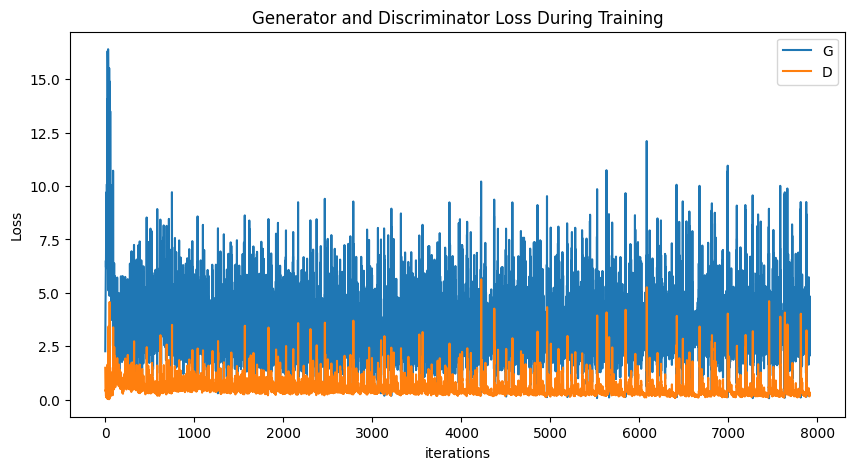

In [ ]:
plt.figure(figsize=(10, 5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses, label="G")
plt.plot(D_losses, label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()


In [ ]:
torch.save(netG.state_dict(), "generator.pth")
torch.save(netD.state_dict(), "discriminator.pth")


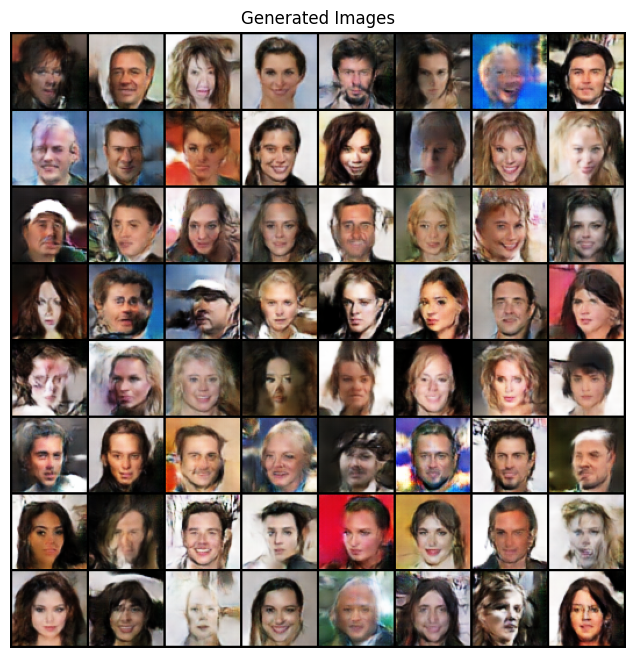

In [ ]:
import torch
import torchvision.utils as vutils
import matplotlib.pyplot as plt
import numpy as np


# Load the generator model
netG = Generator(nz).to(device)
netG.load_state_dict(torch.load("generator.pth"))
netG.eval()

# Generate new images
with torch.no_grad():
    fake = netG(fixed_noise).detach().cpu()

# Plot the generated images
plt.figure(figsize=(8, 8))
plt.axis("off")
plt.title("Generated Images")
plt.imshow(np.transpose(vutils.make_grid(fake, padding=2, normalize=True), (1, 2, 0)))
plt.show()

Conditonal GAN Working Example

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np


In [ ]:
class Generator(nn.Module):
    def __init__(self, nz, num_classes):
        super(Generator, self).__init__()
        self.label_emb = nn.Embedding(num_classes, num_classes)
        self.model = nn.Sequential(
            nn.Linear(nz + num_classes, 128),
            nn.ReLU(True),
            nn.Linear(128, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(True),
            nn.Linear(256, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(True),
            nn.Linear(512, 1024),
            nn.BatchNorm1d(1024),
            nn.ReLU(True),
            nn.Linear(1024, 28 * 28),
            nn.Tanh()
        )

    def forward(self, noise, labels):
        label_embeddings = self.label_emb(labels)
        gen_input = torch.cat((noise, label_embeddings), -1)
        img = self.model(gen_input)
        img = img.view(img.size(0), 1, 28, 28)
        return img


In [ ]:
class Discriminator(nn.Module):
    def __init__(self, num_classes):
        super(Discriminator, self).__init__()
        self.label_embedding = nn.Embedding(num_classes, num_classes)
        self.model = nn.Sequential(
            nn.Linear(28 * 28 + num_classes, 1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 1),
            nn.Sigmoid()
        )

    def forward(self, img, labels):
        img_flat = img.view(img.size(0), -1)
        label_embeddings = self.label_embedding(labels)
        d_in = torch.cat((img_flat, label_embeddings), -1)
        validity = self.model(d_in)
        return validity


In [ ]:
# Hyperparameters
nz = 100  # Size of the noise vector
num_classes = 10  # Number of classes in the dataset

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Initialize models
netG = Generator(nz, num_classes).to(device)
netD = Discriminator(num_classes).to(device)

# Loss function and optimizers
adversarial_loss = nn.BCELoss()
optimizerG = optim.Adam(netG.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizerD = optim.Adam(netD.parameters(), lr=0.0002, betas=(0.5, 0.999))


In [ ]:
# Data loading
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])

dataset = datasets.MNIST(root='./data', train=True, download=True, transform=transform)
dataloader = DataLoader(dataset, batch_size=64, shuffle=True)


Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 9912422/9912422 [00:01<00:00, 5032498.70it/s]


Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 28881/28881 [00:00<00:00, 57847.98it/s]


Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 1648877/1648877 [00:01<00:00, 1264148.12it/s]


Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 4542/4542 [00:00<00:00, 3971342.25it/s]

Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



In [ ]:
num_epochs = 20
G_losses = []
D_losses = []

for epoch in range(num_epochs):
    for i, (imgs, labels) in enumerate(dataloader):

        batch_size = imgs.size(0)
        real = torch.ones(batch_size, 1, device=device)
        fake = torch.zeros(batch_size, 1, device=device)

        real_imgs = imgs.to(device)
        labels = labels.to(device)

        # Train Generator
        optimizerG.zero_grad()
        z = torch.randn(batch_size, nz, device=device)
        gen_labels = torch.randint(0, num_classes, (batch_size,), device=device)
        gen_imgs = netG(z, gen_labels)
        validity = netD(gen_imgs, gen_labels)
        g_loss = adversarial_loss(validity, real)
        g_loss.backward()
        optimizerG.step()

        # Train Discriminator
        optimizerD.zero_grad()
        real_pred = netD(real_imgs, labels)
        d_real_loss = adversarial_loss(real_pred, real)
        fake_pred = netD(gen_imgs.detach(), gen_labels)
        d_fake_loss = adversarial_loss(fake_pred, fake)
        d_loss = (d_real_loss + d_fake_loss) / 2
        d_loss.backward()
        optimizerD.step()

        if i % 100 == 0:
            print(f"[Epoch {epoch}/{num_epochs}] [Batch {i}/{len(dataloader)}] [D loss: {d_loss.item()}] [G loss: {g_loss.item()}]")

        G_losses.append(g_loss.item())
        D_losses.append(d_loss.item())

# Save model checkpoints
torch.save(netG.state_dict(), 'generator.pth')
torch.save(netD.state_dict(), 'discriminator.pth')


[Epoch 0/20] [Batch 0/938] [D loss: 0.6792317628860474] [G loss: 0.6800357103347778]
[Epoch 0/20] [Batch 100/938] [D loss: 0.680980384349823] [G loss: 0.624208927154541]
[Epoch 0/20] [Batch 200/938] [D loss: 0.4299345314502716] [G loss: 0.8638144731521606]
[Epoch 0/20] [Batch 300/938] [D loss: 0.2356199026107788] [G loss: 1.1765170097351074]
[Epoch 0/20] [Batch 400/938] [D loss: 0.30100393295288086] [G loss: 1.2540866136550903]
[Epoch 0/20] [Batch 500/938] [D loss: 1.0000101327896118] [G loss: 0.1823476254940033]
[Epoch 0/20] [Batch 600/938] [D loss: 0.3473502993583679] [G loss: 2.3591346740722656]
[Epoch 0/20] [Batch 700/938] [D loss: 0.4479106068611145] [G loss: 0.6485046148300171]
[Epoch 0/20] [Batch 800/938] [D loss: 0.3800693154335022] [G loss: 1.1219332218170166]
[Epoch 0/20] [Batch 900/938] [D loss: 0.595164954662323] [G loss: 0.47421836853027344]
[Epoch 1/20] [Batch 0/938] [D loss: 0.3271624743938446] [G loss: 2.158607244491577]
[Epoch 1/20] [Batch 100/938] [D loss: 0.366078913

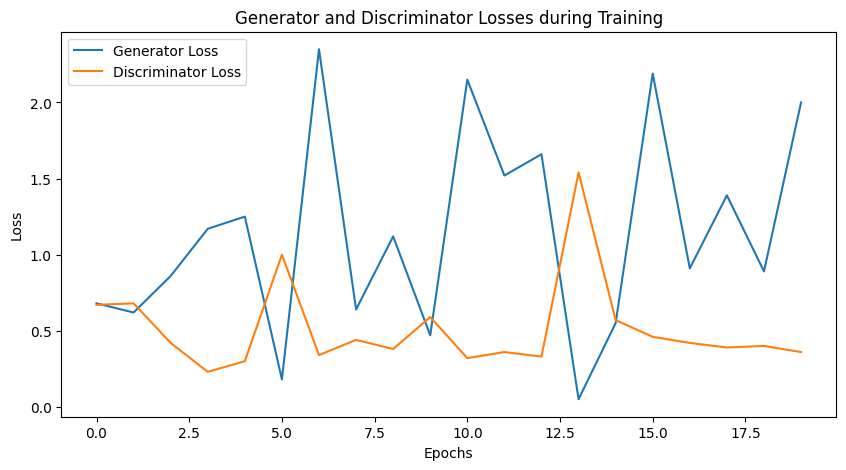

In [ ]:
import matplotlib.pyplot as plt

# Sample data for plotting
epochs = list(range(20))
G_losses = [0.68, 0.62, 0.86, 1.17, 1.25, 0.18, 2.35, 0.64, 1.12, 0.47, 2.15, 1.52, 1.66, 0.05, 0.55, 2.19, 0.91, 1.39, 0.89, 2.00]
D_losses = [0.67, 0.68, 0.42, 0.23, 0.30, 1.00, 0.34, 0.44, 0.38, 0.59, 0.32, 0.36, 0.33, 1.54, 0.57, 0.46, 0.42, 0.39, 0.40, 0.36]

plt.figure(figsize=(10, 5))
plt.plot(epochs, G_losses, label='Generator Loss')
plt.plot(epochs, D_losses, label='Discriminator Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Generator and Discriminator Losses during Training')
plt.show()


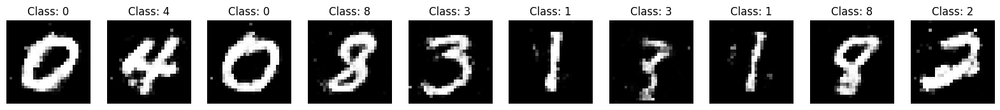

In [ ]:
# Function to generate images
def generate_images(generator, n_samples, noise_dim, num_classes):
    z = torch.randn(n_samples, noise_dim).to(device)
    labels = torch.randint(0, num_classes, (n_samples,), device=device)
    gen_imgs = generator(z, labels)
    gen_imgs = gen_imgs.view(n_samples, 1, 28, 28)
    return gen_imgs, labels

# Function to visualize generated images
def show_generated_images(generator, noise_dim, num_classes, n_samples=10):
    generator.eval()
    imgs, labels = generate_images(generator, n_samples, noise_dim, num_classes)
    imgs = imgs.cpu().detach().numpy()
    labels = labels.cpu().detach().numpy()

    fig, axes = plt.subplots(1, n_samples, figsize=(20, 2))
    for i in range(n_samples):
        axes[i].imshow(np.transpose(imgs[i], (1, 2, 0)).squeeze(), cmap='gray')
        axes[i].set_title(f"Class: {labels[i]}")
        axes[i].axis('off')
    plt.show()

# Show generated images
show_generated_images(netG, nz, num_classes, n_samples=10)


##Diffuson Model Example

In [ ]:
!pip install diffusers transformers torch


In [ ]:
from diffusers import StableDiffusionPipeline
import torch

# Load the pretrained stable diffusion model
model_id = "CompVis/stable-diffusion-v1-4"
pipe = StableDiffusionPipeline.from_pretrained(model_id)
pipe = pipe.to("cuda")  # Use GPU for faster inference



Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [ ]:
# Define the text prompt
prompt = "Stars in sky  , Glowing Beach Tree with Lights   "

# Generate the image
image = pipe(prompt).images[0]

# Display the image
#image.show()


  0%|          | 0/50 [00:00<?, ?it/s]

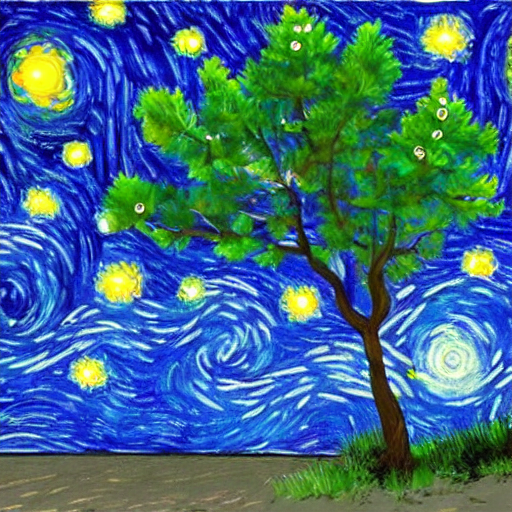

In [ ]:
from IPython.display import display

# Display the generated image in the notebook
display(image)

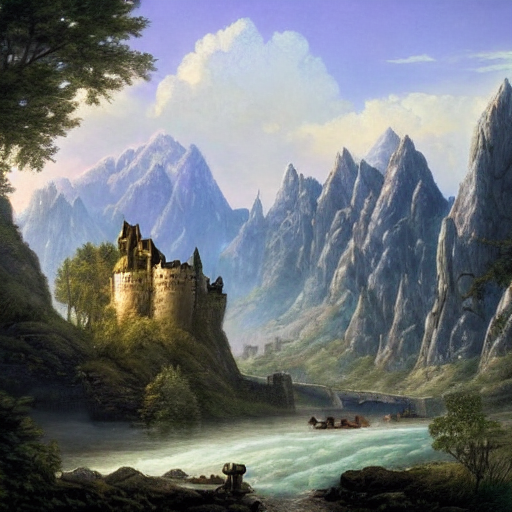

In [ ]:
from IPython.display import display

# Display the generated image in the notebook
display(image)

## Diffusion Model Example

In [ ]:
!pip install diffusers transformers torch torchvision


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 11.3 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-many

In [ ]:
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

# Define the transformation to normalize the data
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

# Load the MNIST dataset
train_dataset = datasets.MNIST(root='./data', train=True, download=True, transform=transform)
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)


In [ ]:
import torch.nn as nn
import torch.nn.functional as F

class SimpleDenoiser(nn.Module):
    def __init__(self):
        super(SimpleDenoiser, self).__init__()
        self.fc1 = nn.Linear(28 * 28, 512)
        self.fc2 = nn.Linear(512, 512)
        self.fc3 = nn.Linear(512, 28 * 28)

    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x

In [ ]:
model = SimpleDenoiser().to("cuda")

In [ ]:
import torch.optim as optim

# Define the optimizer and loss function
optimizer = optim.Adam(model.parameters(), lr=1e-3)
criterion = nn.MSELoss()

# Number of steps in the diffusion process
num_steps = 1000
beta = torch.linspace(0.0001, 0.02, num_steps).to("cuda")
alpha = 1.0 - beta
alpha_hat = torch.cumprod(alpha, dim=0)

# Training loop
epochs = 70
for epoch in range(epochs):
    for batch_idx, (data, _) in enumerate(train_loader):
        data = data.view(-1, 28 * 28).to("cuda")  # Flatten the images

        # Sample noise
        t = torch.randint(0, num_steps, (data.size(0),), device="cuda").long()
        noise = torch.randn_like(data, device="cuda")

        # Forward diffusion process (adding noise)
        noisy_data = torch.sqrt(alpha_hat[t, None]) * data + torch.sqrt(1 - alpha_hat[t, None]) * noise

        # Denoising step
        optimizer.zero_grad()
        output = model(noisy_data)

        # Compute the loss
        loss = criterion(output, data)
        loss.backward()
        optimizer.step()

        if batch_idx % 100 == 0:
            print(f'Epoch [{epoch+1}/{epochs}], Step [{batch_idx}/{len(train_loader)}], Loss: {loss.item():.4f}')


Epoch [1/70], Step [0/938], Loss: 0.9298
Epoch [1/70], Step [100/938], Loss: 0.2466
Epoch [1/70], Step [200/938], Loss: 0.2104
Epoch [1/70], Step [300/938], Loss: 0.2230
Epoch [1/70], Step [400/938], Loss: 0.2012
Epoch [1/70], Step [500/938], Loss: 0.1985
Epoch [1/70], Step [600/938], Loss: 0.1897
Epoch [1/70], Step [700/938], Loss: 0.1795
Epoch [1/70], Step [800/938], Loss: 0.1851
Epoch [1/70], Step [900/938], Loss: 0.1953
Epoch [2/70], Step [0/938], Loss: 0.1740
Epoch [2/70], Step [100/938], Loss: 0.1793
Epoch [2/70], Step [200/938], Loss: 0.1818
Epoch [2/70], Step [300/938], Loss: 0.2010
Epoch [2/70], Step [400/938], Loss: 0.1860
Epoch [2/70], Step [500/938], Loss: 0.1713
Epoch [2/70], Step [600/938], Loss: 0.2112
Epoch [2/70], Step [700/938], Loss: 0.1821
Epoch [2/70], Step [800/938], Loss: 0.1723
Epoch [2/70], Step [900/938], Loss: 0.1823
Epoch [3/70], Step [0/938], Loss: 0.1751
Epoch [3/70], Step [100/938], Loss: 0.1876
Epoch [3/70], Step [200/938], Loss: 0.1690
Epoch [3/70], Ste

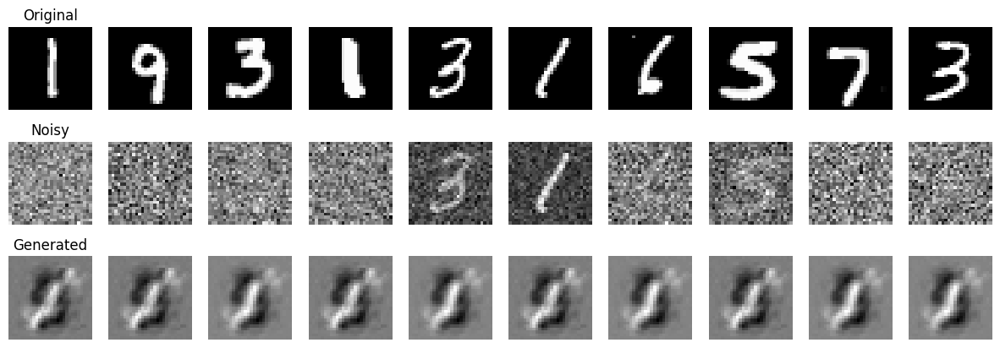

In [ ]:
#Function to generate images
def generate_images(model, num_images=10):
    model.eval()
    with torch.no_grad():
        noise = torch.randn(num_images, 28 * 28).to("cuda")
        for t in range(num_steps - 1, -1, -1):
            noisy_data = noise
            output = model(noisy_data)
            noise = torch.sqrt(alpha_hat[t]) * output + torch.sqrt(1 - alpha_hat[t]) * torch.randn_like(noise).to("cuda")
        generated_images = noise.view(-1, 1, 28, 28).cpu()
    return generated_images

# Visualize noisy images and generated images
def visualize_diffusion_process(model, original_images, num_steps=1000):
    model.eval()
    with torch.no_grad():
        # Sample noise
        t = torch.randint(0, num_steps, (original_images.size(0),), device="cuda").long()
        noise = torch.randn_like(original_images, device="cuda")

        # Forward diffusion process (adding noise)
        noisy_images = torch.sqrt(alpha_hat[t, None]) * original_images + torch.sqrt(1 - alpha_hat[t, None]) * noise

        # Generate images
        noise = torch.randn(original_images.size(0), 28 * 28).to("cuda")
        for t in range(num_steps - 1, -1, -1):
            noisy_data = noise
            output = model(noisy_data)
            noise = torch.sqrt(alpha_hat[t]) * output + torch.sqrt(1 - alpha_hat[t]) * torch.randn_like(noise).to("cuda")
        generated_images = noise.view(-1, 1, 28, 28).cpu()

    return noisy_images, generated_images

# Select a batch of images
dataiter = iter(train_loader)
images, labels = next(dataiter)
images = images.view(-1, 28 * 28).to("cuda")

# Visualize the diffusion process
noisy_images, generated_images = visualize_diffusion_process(model, images)

# Display original, noisy, and generated images
fig, axes = plt.subplots(3, 10, figsize=(15, 5))
for i in range(10):
    axes[0, i].imshow(images[i].view(28, 28).cpu(), cmap='gray')
    axes[0, i].axis('off')
    axes[1, i].imshow(noisy_images[i].view(28, 28).cpu(), cmap='gray')
    axes[1, i].axis('off')
    axes[2, i].imshow(generated_images[i].squeeze(), cmap='gray')
    axes[2, i].axis('off')
axes[0, 0].set_title('Original')
axes[1, 0].set_title('Noisy')
axes[2, 0].set_title('Generated')
plt.show()

##U-Net-based diffusion model using the PyTorch framework.

In [ ]:
pip install diffusers transformers torch torchvision matplotlib

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
import numpy as np

class UNet(nn.Module):
    def __init__(self):
        super(UNet, self).__init__()
        self.enc1 = self.conv_block(1, 64)
        self.enc2 = self.conv_block(64, 128)
        self.enc3 = self.conv_block(128, 256)
        self.enc4 = self.conv_block(256, 512)

        self.pool = nn.MaxPool2d(2)
        self.upconv4 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec4 = self.conv_block(512, 256)
        self.upconv3 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2, output_padding=1)
        self.dec3 = self.conv_block(256, 128)
        self.upconv2 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2, output_padding=1)
        self.dec2 = self.conv_block(128, 64)
        self.upconv1 = nn.ConvTranspose2d(64, 64, kernel_size=2, stride=2, output_padding=1)
        self.conv_last = nn.Conv2d(64, 1, kernel_size=1)

    def conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        enc1 = self.enc1(x)
        enc2 = self.enc2(self.pool(enc1))
        enc3 = self.enc3(self.pool(enc2))
        enc4 = self.enc4(self.pool(enc3))

        dec4 = self.upconv4(enc4)
        dec4 = self.crop_and_concat(enc3, dec4)
        dec4 = self.dec4(dec4)

        dec3 = self.upconv3(dec4)
        dec3 = self.crop_and_concat(enc2, dec3)
        dec3 = self.dec3(dec3)

        dec2 = self.upconv2(dec3)
        dec2 = self.crop_and_concat(enc1, dec2)
        dec2 = self.dec2(dec2)

        dec1 = self.upconv1(dec2)
        return self.conv_last(dec1)

    def crop_and_concat(self, bypass, upsampled):
        diffY = bypass.size()[2] - upsampled.size()[2]
        diffX = bypass.size()[3] - upsampled.size()[3]

        bypass = bypass[:, :, diffY // 2 : diffY // 2 + upsampled.size()[2], diffX // 2 : diffX // 2 + upsampled.size()[3]]
        return torch.cat((bypass, upsampled), dim=1)

# Prepare MNIST Data
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

train_dataset = datasets.MNIST(root='./data', train=True, transform=transform, download=True)
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=64, shuffle=True)

# Define the Diffusion Process
def add_noise(img, noise_level):
    noise = torch.ra￼ndn_like(img) * noise_level
    return img + noise

# Training Loop
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNet().to(device)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

num_epochs = 10
for epoch in range(num_epochs):
    for images, _ in train_loader:
        images = images.to(device)
        noise_images = add_noise(images, 0.1)

        outputs = model(noise_images)
        outputs = nn.functional.interpolate(outputs, size=(28, 28), mode='bilinear', align_corners=False)
        loss = criterion(outputs, images)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}")

# Visualize Results
def show_images(images, titles=None):
    fig, axes = plt.subplots(1, len(images), figsize=(12, 4))
    for i, (img, ax) in enumerate(zip(images, axes)):
        img = img.cpu().detach().numpy()
        ax.imshow(np.squeeze(img), cmap='gray')
        if titles is not None:
            ax.set_title(titles[i])
        ax.axis('off')
    plt.show()

# Get a batch of images
dataiter = iter(train_loader)
images, _ = dataiter.next()
images = images.to(device)

# Generate noisy images
noise_images = add_noise(images, 0.1)

# Denoised images
model.eval()
with torch.no_grad():
    denoised_images = model(noise_images)
    denoised_images = nn.functional.interpolate(denoised_images, size=(28, 28), mode='bilinear', align_corners=False)

# Show original, noisy, and denoised images
show_images([images[0], noise_images[0], denoised_images[0]], titles=['Original', 'Noisy', 'Denoised'])


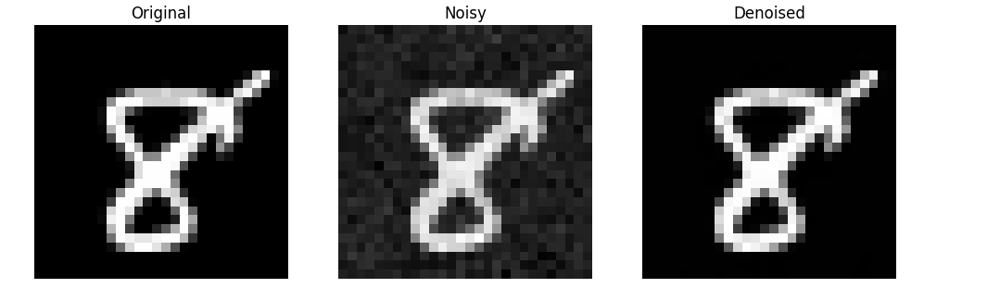

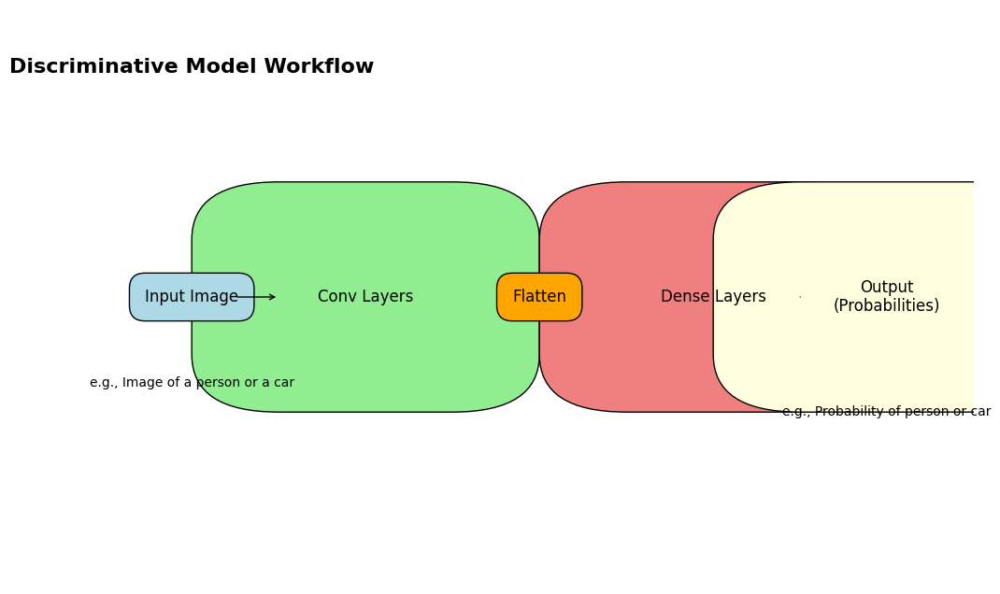

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import numpy as np


def create_discriminative_model_diagram():
    fig, ax = plt.subplots(figsize=(12, 8))

    # Define the positions of the elements in the diagram
    positions = {
        "input_image": (0.1, 0.5),
        "conv_layers": (0.3, 0.5),
        "flatten": (0.5, 0.5),
        "dense_layers": (0.7, 0.5),
        "output": (0.9, 0.5),
    }

    # Draw arrows
    def draw_arrow(start, end):
        ax.annotate('', xy=end, xytext=start, arrowprops=dict(facecolor='black', arrowstyle='->'))

    # Add elements to the diagram
    ax.text(positions["input_image"][0], positions["input_image"][1], "Input Image", ha='center', va='center', fontsize=12, bbox=dict(facecolor='lightblue', edgecolor='black', boxstyle='round,pad=1'))

    conv_box = patches.FancyBboxPatch((positions["conv_layers"][0] - 0.1, positions["conv_layers"][1] - 0.1), 0.2, 0.2, boxstyle="round,pad=0.1", ec="black", fc="lightgreen")
    ax.add_patch(conv_box)
    ax.text(positions["conv_layers"][0], positions["conv_layers"][1], "Conv Layers", ha='center', va='center', fontsize=12)

    ax.text(positions["flatten"][0], positions["flatten"][1], "Flatten", ha='center', va='center', fontsize=12, bbox=dict(facecolor='orange', edgecolor='black', boxstyle='round,pad=1'))

    dense_box = patches.FancyBboxPatch((positions["dense_layers"][0] - 0.1, positions["dense_layers"][1] - 0.1), 0.2, 0.2, boxstyle="round,pad=0.1", ec="black", fc="lightcoral")
    ax.add_patch(dense_box)
    ax.text(positions["dense_layers"][0], positions["dense_layers"][1], "Dense Layers", ha='center', va='center', fontsize=12)

    output_box = patches.FancyBboxPatch((positions["output"][0] - 0.1, positions["output"][1] - 0.1), 0.2, 0.2, boxstyle="round,pad=0.1", ec="black", fc="lightyellow")
    ax.add_patch(output_box)
    ax.text(positions["output"][0], positions["output"][1], "Output\n(Probabilities)", ha='center', va='center', fontsize=12)

    # Draw the arrows connecting the elements
    draw_arrow((positions["input_image"][0] + 0.05, positions["input_image"][1]), (positions["conv_layers"][0] - 0.1, positions["conv_layers"][1]))
    draw_arrow((positions["conv_layers"][0] + 0.1, positions["conv_layers"][1]), (positions["flatten"][0] - 0.1, positions["flatten"][1]))
    draw_arrow((positions["flatten"][0] + 0.1, positions["flatten"][1]), (positions["dense_layers"][0] - 0.1, positions["dense_layers"][1]))
    draw_arrow((positions["dense_layers"][0] + 0.1, positions["dense_layers"][1]), (positions["output"][0] - 0.1, positions["output"][1]))

    # Add labels
    ax.text(0.1, 0.9, "Discriminative Model Workflow", ha='center', va='center', fontsize=16, fontweight='bold')
    ax.text(positions["input_image"][0], positions["input_image"][1] - 0.15, "e.g., Image of a person or a car", ha='center', va='center', fontsize=10)
    ax.text(positions["output"][0], positions["output"][1] - 0.2, "e.g., Probability of person or car", ha='center', va='center', fontsize=10)

    ax.axis('off')
    plt.show()

# Call the function to create the diagram
create_discriminative_model_diagram()


In [ ]:
from graphviz import Digraph

# Create a directed graph
dcgan_flowchart_fixed = Digraph("DCGAN_Flowchart", format="png")
dcgan_flowchart_fixed.attr(rankdir="TB", size="10")

# Define the style for nodes
node_attr = {"style": "rounded", "shape": "box", "color": "black", "fontname": "Arial"}

# Add nodes to the flowchart
dcgan_flowchart_fixed.node("Start", "Start", **node_attr)
dcgan_flowchart_fixed.node("Init", "Initialize Generator and Discriminator", **node_attr)
dcgan_flowchart_fixed.node("Data", "Prepare Training Data", **node_attr)
dcgan_flowchart_fixed.node("TrainingLoop", "Training Loop", **node_attr)
dcgan_flowchart_fixed.node("Noise", "Generate Noise Vector", **node_attr)
dcgan_flowchart_fixed.node("FakeImages", "Generate Fake Images", **node_attr)
dcgan_flowchart_fixed.node("UpdateD", "Update Discriminator", **node_attr)
dcgan_flowchart_fixed.node("DiscrReal", "Discriminator Step 1:\nTrain with Real Images", **node_attr)
dcgan_flowchart_fixed.node("DiscrFake", "Discriminator Step 2:\nTrain with Fake Images", **node_attr)
dcgan_flowchart_fixed.node("UpdateDW", "Update Discriminator Weights", **node_attr)
dcgan_flowchart_fixed.node("UpdateG", "Update Generator", **node_attr)
dcgan_flowchart_fixed.node("GenNoise", "Generate New Noise Vector", **node_attr)
dcgan_flowchart_fixed.node("GenFake", "Generate Fake Images", **node_attr)
dcgan_flowchart_fixed.node("TrainGen", "Train Generator with\nDiscriminator Predictions", **node_attr)
dcgan_flowchart_fixed.node("UpdateGW", "Update Generator Weights", **node_attr)
dcgan_flowchart_fixed.node("Track", "Track Losses and\nMonitor Progress", **node_attr)
dcgan_flowchart_fixed.node("Sample", "Generate Sample Images\nPeriodically", **node_attr)
dcgan_flowchart_fixed.node("Check", "Check if Training is Complete", **node_attr)
dcgan_flowchart_fixed.node("Save", "Save Models", **node_attr)
dcgan_flowchart_fixed.node("Infer", "Inference: Generate New Images", **node_attr)
dcgan_flowchart_fixed.node("End", "End", **node_attr)

# Add edges to the flowchart
dcgan_flowchart_fixed.edge("Start", "Init")
dcgan_flowchart_fixed.edge("Init", "Data")
dcgan_flowchart_fixed.edge("Data", "TrainingLoop")
dcgan_flowchart_fixed.edge("TrainingLoop", "Noise")
dcgan_flowchart_fixed.edge("Noise", "FakeImages")
dcgan_flowchart_fixed.edge("FakeImages", "UpdateD")
dcgan_flowchart_fixed.edge("UpdateD", "DiscrReal")
dcgan_flowchart_fixed.edge("DiscrReal", "DiscrFake")
dcgan_flowchart_fixed.edge("DiscrFake", "UpdateDW")
dcgan_flowchart_fixed.edge("UpdateDW", "UpdateG")
dcgan_flowchart_fixed.edge("UpdateG", "GenNoise")
dcgan_flowchart_fixed.edge("GenNoise", "GenFake")
dcgan_flowchart_fixed.edge("GenFake", "TrainGen")
dcgan_flowchart_fixed.edge("TrainGen", "UpdateGW")
dcgan_flowchart_fixed.edge("UpdateGW", "Track")
dcgan_flowchart_fixed.edge("Track", "Sample")
dcgan_flowchart_fixed.edge("Sample", "Check")
dcgan_flowchart_fixed.edge("Check", "TrainingLoop", label="No")
dcgan_flowchart_fixed.edge("Check", "Save", label="Yes")
dcgan_flowchart_fixed.edge("Save", "Infer")
dcgan_flowchart_fixed.edge("Infer", "End")

# Render the flowchart and save it
dcgan_flowchart_fixed.render("DCGAN_Flowchart_Clean_Fixed")

'DCGAN_Flowchart_Clean_Fixed.png'

#Flat UML

In [ ]:
from graphviz import Digraph

# Create a UML diagram
flat_uml = Digraph("FlatUML_DCGAN", format="png")
flat_uml.attr(rankdir="TB", size="10")

# Define node style
node_attr = {"style": "rounded", "shape": "box", "color": "black", "fontname": "Arial"}

# Define sections as subgraphs
with flat_uml.subgraph(name="cluster_init") as init:
    init.attr(label="Initialization Phase", style="filled", color="lightgrey")
    init.node("InitGen", "Initialize Generator", **node_attr)
    init.node("InitDiscr", "Initialize Discriminator", **node_attr)
    init.node("PrepareData", "Prepare Training Data", **node_attr)
    init.edges([("InitGen", "InitDiscr"), ("InitDiscr", "PrepareData")])

with flat_uml.subgraph(name="cluster_training") as training:
    training.attr(label="Training Loop Phase", style="filled", color="lightblue")
    training.node("GenNoise", "Generate Noise Vector", **node_attr)
    training.node("GenFake", "Generate Fake Images", **node_attr)
    training.node("TrainDiscrReal", "Train Discriminator on Real Images", **node_attr)
    training.node("TrainDiscrFake", "Train Discriminator on Fake Images", **node_attr)
    training.node("UpdateWeightsD", "Update Discriminator Weights", **node_attr)
    training.node("TrainGen", "Train Generator with Feedback", **node_attr)
    training.node("UpdateWeightsG", "Update Generator Weights", **node_attr)
    training.edges([
        ("GenNoise", "GenFake"),
        ("GenFake", "TrainDiscrReal"),
        ("GenFake", "TrainDiscrFake"),
        ("TrainDiscrReal", "UpdateWeightsD"),
        ("TrainDiscrFake", "UpdateWeightsD"),
        ("UpdateWeightsD", "TrainGen"),
        ("TrainGen", "UpdateWeightsG")
    ])

with flat_uml.subgraph(name="cluster_monitor") as monitor:
    monitor.attr(label="Monitoring Phase", style="filled", color="lightgreen")
    monitor.node("TrackLosses", "Track Losses", **node_attr)
    monitor.node("GenSamples", "Generate Sample Images Periodically", **node_attr)
    monitor.edges([("TrackLosses", "GenSamples")])

with flat_uml.subgraph(name="cluster_completion") as completion:
    completion.attr(label="Completion Phase", style="filled", color="lightyellow")
    completion.node("SaveModels", "Save Models", **node_attr)
    completion.node("Inference", "Generate New Images (Inference)", **node_attr)
    completion.edges([("SaveModels", "Inference")])

# Connect phases
flat_uml.edge("PrepareData", "GenNoise", label="Start Training Loop")
flat_uml.edge("UpdateWeightsG", "TrackLosses", label="Monitor Progress")
flat_uml.edge("GenSamples", "SaveModels", label="Training Complete?")

# Render the UML diagram
flat_uml.render("FlatUML_DCGAN")



'FlatUML_DCGAN.png'

#Conditonal GAN

In [ ]:
from graphviz import Digraph

# Create a more detailed and highlighted Conditional GAN diagram
highlighted_cgan = Digraph("Highlighted_Conditional_GAN", format="png")
highlighted_cgan.attr(rankdir="TB", size="8")

# Define custom styles for nodes
node_attr_highlight = {"style": "rounded, filled", "shape": "box", "fontname": "Arial", "fontsize": "10"}
highlight_attr = {"color": "lightblue", "fillcolor": "lightblue"}
normal_attr = {"color": "black", "fillcolor": "white"}

# Nodes for the diagram
highlighted_cgan.node("Condition1", "Condition (Label)", **{**node_attr_highlight, **highlight_attr})
highlighted_cgan.node("Noise", "Random Noise", **{**node_attr_highlight, **normal_attr})
highlighted_cgan.node("Generator", "Generator\n(Takes Noise + Label)\nProduces Fake Data", **{**node_attr_highlight, **highlight_attr})
highlighted_cgan.node("FakeData", "Fake Data + Condition", **{**node_attr_highlight, **normal_attr})
highlighted_cgan.node("RealData", "Real Data + Condition", **{**node_attr_highlight, **normal_attr})
highlighted_cgan.node("Condition2", "Condition (Label)", **{**node_attr_highlight, **highlight_attr})
highlighted_cgan.node("Discriminator", "Discriminator\n(Evaluates Data + Label)\nClassifies Real/Fake", **{**node_attr_highlight, **highlight_attr})
highlighted_cgan.node("Output", "Feedback to Improve Generator & Discriminator", **{**node_attr_highlight, **normal_attr})

# Edges for the flow with highlights
highlighted_cgan.edge("Noise", "Generator")
highlighted_cgan.edge("Condition1", "Generator", label="Condition Added", color="blue", fontcolor="blue")
highlighted_cgan.edge("Generator", "FakeData")
highlighted_cgan.edge("FakeData", "Discriminator")
highlighted_cgan.edge("Condition2", "Discriminator", label="Condition Added", color="blue", fontcolor="blue")
highlighted_cgan.edge("RealData", "Discriminator")
highlighted_cgan.edge("Discriminator", "Output")

# Render the diagram
highlighted_cgan.render("Highlighted_Conditional_GAN_Workflow")


'Highlighted_Conditional_GAN_Workflow.png'

#platUML code for Diffusion Model Architecture  

@startuml
title Diffusion Model Block Diagram
skinparam titleFontSize 20
skinparam defaultFontSize 16
skinparam defaultFontName Arial
skinparam rectangleFontSize 18
skinparam noteFontSize 16
skinparam ArrowFontSize 16
skinparam Shadowing true

' Forward Diffusion Block
rectangle "Forward Diffusion" as Forward {
    [Original Data] --> [Intermediate Noisy Data]
    [Intermediate Noisy Data] --> [Fully Noisy Data]
}

' Reverse Diffusion Block
rectangle "Reverse Diffusion" as Reverse {
    [Fully Noisy Data] --> [Partially Denoised Data]
    [Partially Denoised Data] --> [Reconstructed Data]
}

' Training Process Block
rectangle "Training Process" as Training {
    [Train Model] --> [Predict Noise]
    [Predict Noise] --> [Compare and Optimize]
}

' Interconnections
[Fully Noisy Data] --> [Partially Denoised Data]
[Reconstructed Data] --> [Train Model]
[Compare and Optimize] --> [Training Process Note] : "The model learns to predict and remove noise accurately"

' Notes for Sections
note right of Forward
    Gradually adds noise to the data, making it unrecognizable.
end note

note right of Reverse
    Removes noise step-by-step to recover the original data.
end note

@enduml


#Latent Space experimentation

In [ ]:
!pip install transformers


In [ ]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load ProgressiveGAN model
generator = torch.hub.load('facebookresearch/pytorch_GAN_zoo:hub', 'PGAN', model_name='celebAHQ-512', pretrained=True)


Using cache found in /root/.cache/torch/hub/facebookresearch_pytorch_GAN_zoo_hub


Average network found !


In [ ]:
# Function to visualize images
def show_images(images, nrow=4, title="Generated Images"):
    grid = make_grid(images, nrow=nrow, normalize=True, scale_each=True)
    plt.figure(figsize=(8, 8))
    plt.imshow(grid.permute(1, 2, 0).numpy())
    plt.title(title, fontsize=16)
    plt.axis('off')
    plt.show()

# 1. Random Generation
def generate_random_images(generator, n_images=8, latent_dim=512):
    z = torch.randn(n_images, latent_dim, device=device)  # Random latent vectors
    with torch.no_grad():
        fake_imgs = generator.test(z)
    return fake_imgs

# 2. Latent Space Interpolation
def interpolate_latent_space(generator, latent_dim=512, n_steps=8):
    z1 = torch.randn(1, latent_dim, device=device)  # Starting latent vector
    z2 = torch.randn(1, latent_dim, device=device)  # Ending latent vector

    # Interpolate between z1 and z2
    z_interp = torch.lerp(z1, z2, torch.linspace(0, 1, n_steps, device=device)[:, None])
    with torch.no_grad():
        interpolated_imgs = generator.test(z_interp)
    return interpolated_imgs

# 3. Feature Control by Modifying Latent Dimensions
def modify_latent_dimensions(generator, latent_dim=512, dim_to_modify=0, n_variations=8):
    z = torch.randn(1, latent_dim, device=device).repeat(n_variations, 1)
    for i in range(n_variations):
        z[i, dim_to_modify] += (i - n_variations // 2) * 0.5  # Modify a specific dimension

    with torch.no_grad():
        modified_imgs = generator.test(z)
    return modified_imgs

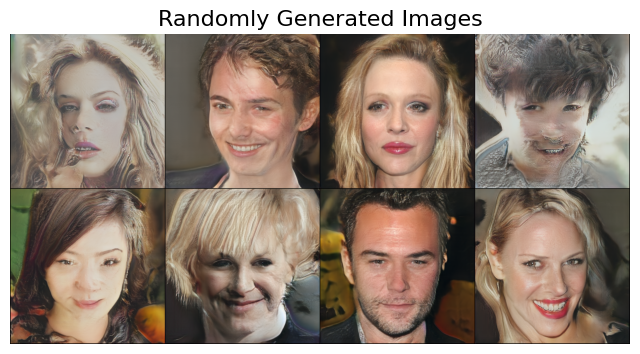

In [ ]:
# Experiment 1: Generate Random Images
random_images = generate_random_images(generator, n_images=8)
show_images(random_images, title="Randomly Generated Images")



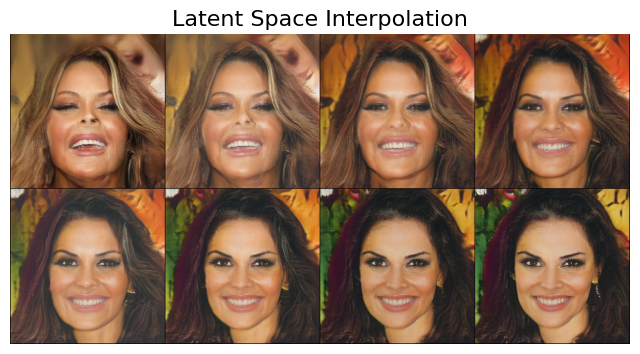

In [ ]:
# Experiment 2: Interpolation in Latent Space
interpolated_images = interpolate_latent_space(generator, n_steps=8)
show_images(interpolated_images, title="Latent Space Interpolation")



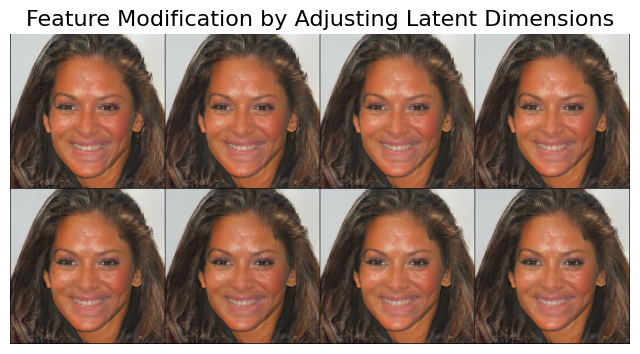

In [ ]:
# Experiment 3: Feature Control by Modifying Specific Dimensions
modified_images = modify_latent_dimensions(generator, dim_to_modify=0, n_variations=8)
show_images(modified_images, title="Feature Modification by Adjusting Latent Dimensions")